# Import the dataset 

In [2]:
import pandas as pd
import os 
import arff 
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns 


# Read from arff file 

cwd = os.getcwd()
path = cwd + "\\Airlines.arff"

dataset = arff.load(open('Airlines.arff', 'rt'))
data = np.array(dataset['data'])

arf = pd.DataFrame(data, columns=["DayofWeek", "CRSDepTime", "UniqueCarrier", "FlightNum" ,"Origin", "Dest", "ArrDelay"])

arf.head()

,DayofWeek,CRSDepTime,UniqueCarrier,FlightNum,Origin,Dest,ArrDelay
0,5.0,600.0,UA,899.0,ORD,IAD,-3.0
1,5.0,615.0,DL,357.0,IAD,ATL,5.0
2,5.0,615.0,UA,341.0,IAD,DEN,8.0
3,5.0,625.0,CO,581.0,IAD,DEN,44.0
4,5.0,630.0,UA,902.0,CLE,IAD,-10.0


In [2]:
## or directly from csv after we convert it from arff 

df = pd.read_csv('Airlines.csv')
df.FlightNum = df.FlightNum.astype(int)

In [3]:
df

,id,DayofWeek,CRSDepTime,UniqueCarrier,FlightNum,Origin,Dest,ArrDelay
0,1,5,600,UA,899,ORD,IAD,-3
1,2,5,615,DL,357,IAD,ATL,5
2,3,5,615,UA,341,IAD,DEN,8
3,4,5,625,CO,581,IAD,DEN,44
4,5,5,630,UA,902,CLE,IAD,-10
...,...,...,...,...,...,...,...,...
100156,100157,6,2140,UA,30,LAX,IAD,-19
100157,100158,6,2140,CO,896,LAX,IAD,-23
100158,100159,6,2150,UA,1094,IAD,BDL,-14
100159,100160,6,2155,US,394,PIT,IAD,9


#### Definition of the data set variables   

**id** : The flight id 

**Day of week** : 1 (Monday) - 7 (Sunday)

**CRSDepTime** : scheduled departure time (local, hhmm)
    
**UniqueCarrier** : unique carrier code
    
**FlightNum** : flight number
    
**Origin** : origin IATA airport code
    
**Dest** : destination IATA airport code
    
**ArrDelay** : Difference in minutes between scheduled and actual arrival time. Early arrivals show negative numbers, in minutes


# Exploratory Data Analysis EDA

In [4]:
df.dtypes

id                int64
DayofWeek         int64
CRSDepTime        int64
UniqueCarrier    object
FlightNum         int32
Origin           object
Dest             object
ArrDelay          int64
dtype: object

In [5]:
df.shape

(100161, 8)

##### Descriptive Statistics per feature 

In [6]:
df.describe()

,id,DayofWeek,CRSDepTime,FlightNum,ArrDelay
count,100161.000000,100161.000000,100161.000000,100161.000000,100161.000000
mean,50081.000000,3.952626,1357.918262,896.152654,4.638462
std,28914.134493,1.985074,460.022924,476.977517,23.397863
min,1.000000,1.000000,5.000000,12.000000,-72.000000
25%,25041.000000,2.000000,925.000000,539.000000,-7.000000
50%,50081.000000,4.000000,1335.000000,1000.000000,0.000000
75%,75121.000000,6.000000,1735.000000,1264.000000,9.000000
max,100161.000000,7.000000,2359.000000,4007.000000,667.000000


In [21]:
df.loc[:,"DayofWeek":].describe().T.style.bar(
    subset=["mean"], color="#205ff2"
).background_gradient(subset=["std"], cmap="Reds").background_gradient(
    subset=["50%"], cmap="coolwarm"
)

,count,mean,std,min,25%,50%,75%,max
DayofWeek,100161.000000,3.952626,1.985074,1.000000,2.000000,4.000000,6.000000,7.000000
CRSDepTime,100161.000000,1357.918262,460.022924,5.000000,925.000000,1335.000000,1735.000000,2359.000000
FlightNum,100161.000000,896.152654,476.977517,12.000000,539.000000,1000.000000,1264.000000,4007.000000
ArrDelay,100161.000000,4.638462,23.397863,-72.000000,-7.000000,0.000000,9.000000,667.000000


#### Plot the histograms and density plots for every attribute of the dataset 

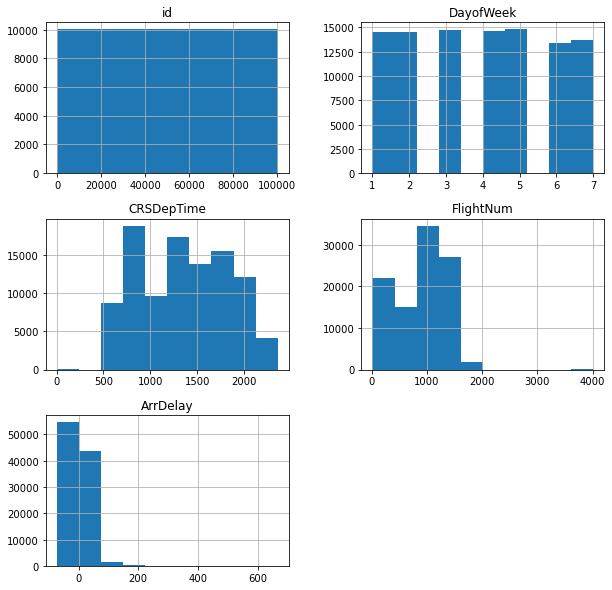

In [64]:
plt.rcParams["figure.figsize"] = (10,10)
df.hist()
plt.show()

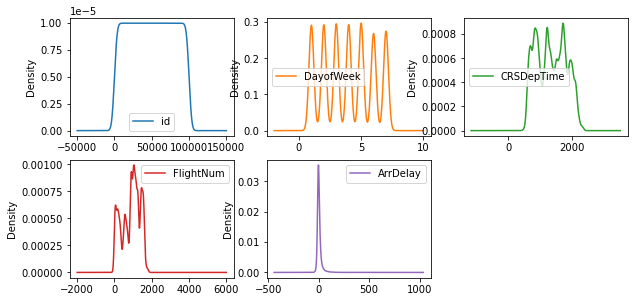

In [65]:
df.plot(kind='density', subplots=True, layout=(4,3), sharex=False)
plt.show()

From the density plots and the histograms we can get the following insights: 

* ArrDelay positively skewed and leptokurtic
* Some departure times are more frequent than the other (no uniformly distributed)

##### Checking for skewness 

In [5]:
df.skew()

id            0.000000
DayofWeek     0.031229
CRSDepTime    0.065324
FlightNum    -0.318826
ArrDelay      4.482490
dtype: float64

* If the skewness is between **-0.5 and 0.5**, the data are fairly **symmetrical**

* If the skewness is between **-1 and — 0.5** or between **0.5 and 1**, the data are **moderately skewed**
* If the skewness is less than **-1 or greater than 1**, the data are **highly skewed**

ArrDelay is highly skewed.

##### Checking for kurtosis  

In [6]:
df.kurtosis()

id            -1.200000
DayofWeek     -1.225843
CRSDepTime    -1.177150
FlightNum     -0.995107
ArrDelay      40.347944
dtype: float64

* If the distribution is tall and thin it is called a leptokurtic distribution (**Kurtosis > 3**). Values in a **leptokurtic** distribution are near the mean or at the extremes.
* A flat distribution where the values are moderately spread out (i.e., unlike leptokurtic) is called **platykurtic** (**Kurtosis <3**) distribution.
* A distribution whose shape is in between a leptokurtic distribution and a platykurtic distribution is called a mesokurtic (__Kurtosis=3__) distribution. A __mesokurtic__ distribution looks more close to a normal distribution.

**High kurtosis in a data set is an indicator that data has heavy outliers.**


**Low kurtosis in a data set is an indicator that data has lack of outliers.**

We are interested in ArrDelay from numerical data and it seems to have high kurtosis, indicating the existence of outliers.

##### Searching for missing values 

In [66]:
df.isnull().sum()

id               0
DayofWeek        0
CRSDepTime       0
UniqueCarrier    0
FlightNum        0
Origin           0
Dest             0
ArrDelay         0
dtype: int64

In [67]:
df.isna().sum()

id               0
DayofWeek        0
CRSDepTime       0
UniqueCarrier    0
FlightNum        0
Origin           0
Dest             0
ArrDelay         0
dtype: int64

From the figures above we can see that there are not any null/na values in the dataset 

#### Searching for duplicates in the dataset  

In [69]:
duplicate_values = df[df.duplicated()]
duplicate_values

,id,DayofWeek,CRSDepTime,UniqueCarrier,FlightNum,Origin,Dest,ArrDelay


There are not any duplicated values in the dataset 

#### Searching for outliers via Boxplots

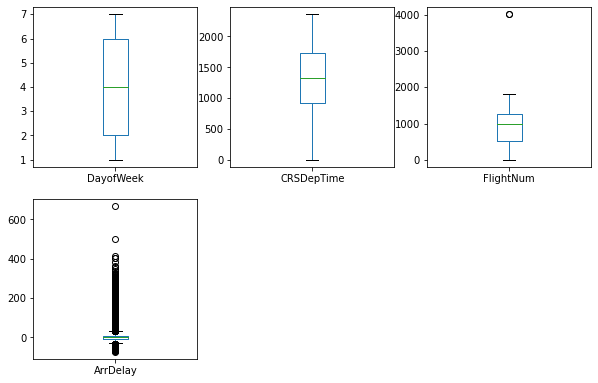

In [80]:
df.loc[:,"DayofWeek":].plot(kind='box', subplots=True, layout=(3,3), sharex=False, sharey=False)
plt.show()

<AxesSubplot:>

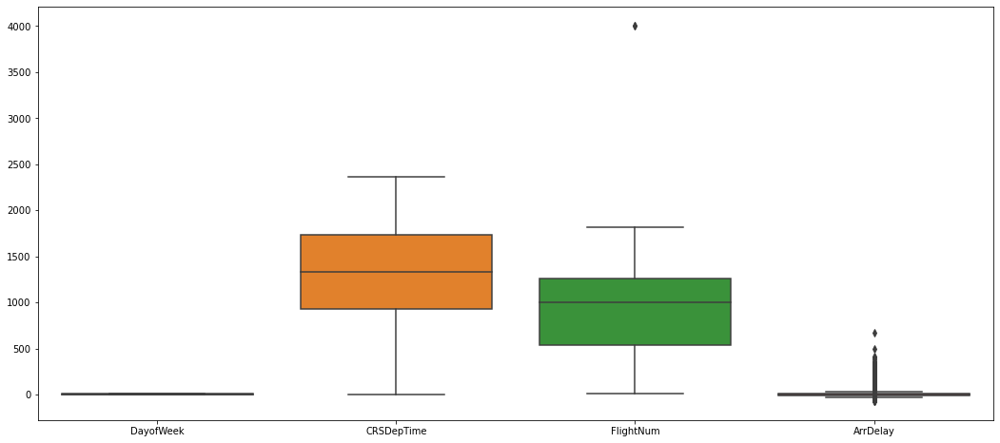

In [79]:
f = plt.figure(figsize=(18,8))
sns.boxplot(data=df.loc[:,"DayofWeek":])

<AxesSubplot:>

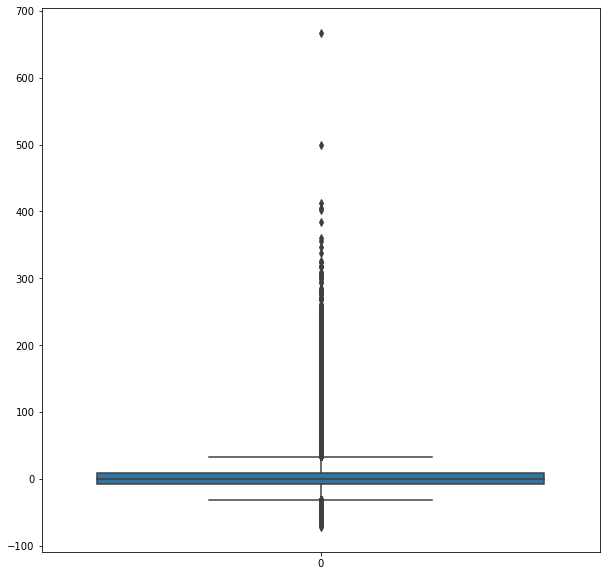

In [83]:
f = plt.figure(figsize=(10,10))
sns.boxplot(data=df.loc[:,"ArrDelay"])

Of course there is indication of outliers in Airdelay. However, those values are not random noise and since are part of the insights we want to derive out of the data will be kept intact.

##### Or by using dataprep 

In [192]:
! pip install dataprep

  Using cached dataprep-0.4.1-py3-none-any.whl (3.5 MB)
  Using cached usaddress-0.5.10-py2.py3-none-any.whl (63 kB)
  Using cached jsonpath_ng-1.5.3-py3-none-any.whl (29 kB)
  Using cached varname-0.8.1-py3-none-any.whl (20 kB)
  Using cached Metaphone-0.6.tar.gz (14 kB)
  Using cached Flask-1.1.4-py2.py3-none-any.whl (94 kB)
  Using cached dask-2.30.0-py3-none-any.whl (848 kB)


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
distributed 2021.4.0 requires dask>=2021.03.0, but you have dask 2.30.0 which is incompatible.


  Created wheel for metaphone: filename=Metaphone-0.6-py3-none-any.whl size=13905 sha256=9a23fe27ae79aa62825272a35446c71f9de64f3f9ca684160f6a0fa0a2277e6f
  Stored in directory: c:\users\tsaro\appdata\local\pip\cache\wheels\1d\a8\cb\6f8902aa5457bd71344e00665c230e9c45255b3f57f2194a0f
Successfully built metaphone
  Attempting uninstall: regex
    Found existing installation: regex 2021.4.4
    Uninstalling regex-2021.4.4:
      Successfully uninstalled regex-2021.4.4
  Attempting uninstall: flask
    Found existing installation: Flask 1.1.2
    Uninstalling Flask-1.1.2:
      Successfully uninstalled Flask-1.1.2
  Attempting uninstall: dask
    Found existing installation: dask 2021.4.0
    Uninstalling dask-2021.4.0:
      Successfully uninstalled dask-2021.4.0


In [19]:
from dataprep.eda import *
from dataprep.datasets import load_dataset
from dataprep.eda import plot, plot_correlation, plot_missing, plot_diff, create_report

Note: NumExpr detected 16 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.


  0%|                                                                                          | 0/129 [00:00<…


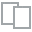
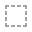
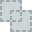
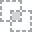
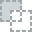
...
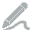
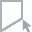
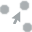
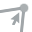
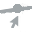

In [6]:
plot_missing(df)


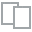
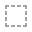
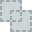
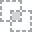
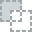
...
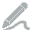
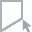
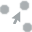
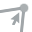
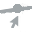

In [7]:
# Correlation 

plot_correlation(df)

  0%|                                                                                         | 0/1093 [00:00<…

DataPrep Report
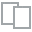
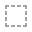
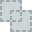
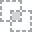
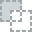
...
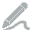
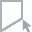
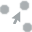
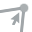
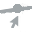

In [20]:
create_report(df)

# Describe the average delays per airport/airline

Decide to keep the dataset with delays only.

In [15]:
df_d = df[df.ArrDelay>0]

In [30]:
# Mean delay per airline 
Airline_delay = df_d.groupby(['UniqueCarrier'])['ArrDelay'].mean()
Airline_delay.sort_values(ascending=False)

UniqueCarrier
EA        29.656250
CO        25.263850
PA (1)    24.626087
TW        20.492208
AA        17.602251
UA        17.565617
NW        16.083420
DL        15.932035
US        12.017257
Name: ArrDelay, dtype: float64

In [31]:
# Mean delay per Origin 
Origin_delay = df_d.groupby(['Origin'])['ArrDelay'].mean()
Origin_delay.sort_values(ascending=False)

Origin
DCA    48.000000
JFK    38.975000
SJU    36.394118
HPN    34.638095
ORD    24.410609
DEN    23.060732
BOS    22.447967
EWR    20.637500
PBI    20.354108
IAH    20.164804
SEA    19.019868
MSP    18.996743
IAD    18.941091
SFO    18.934809
LGA    18.807091
BNA    18.653061
BDL    17.770548
DFW    17.762573
DTW    17.500581
MHT    16.903030
MDW    16.772727
SLC    16.765244
CAE    16.655556
STL    16.499089
BTV    16.239130
PHX    15.937500
LAX    15.658217
PWM    15.559406
PVD    15.536585
FLL    15.246418
ORF    14.735915
JAX    14.672222
MCO    14.576733
TPA    14.557652
ISP    14.396825
MEM    14.361111
SDF    14.333333
ATL    14.269446
MSY    14.238835
SAV    13.786667
IND    13.472727
MIA    13.215434
PHL    13.195531
RIC    13.000000
PIT    12.925094
BWI    12.578947
CHS    12.438356
CLE    11.924399
RDU    11.841509
MDT    11.000000
RSW    10.702290
ROC    10.648438
SYR    10.475309
GSO     9.285714
SRQ     9.171875
HOU     9.169811
BUF     8.994624
PHF     6.171171
Name: A

In [32]:
# Mean delay per Destination 
Destination_delay = df_d.groupby(['Dest'])['ArrDelay'].mean()
Destination_delay.sort_values(ascending=False)

Dest
DEN    26.889979
SFO    26.010355
ISP    25.918919
RSW    24.541096
TPA    24.518987
BWI    24.454545
BOS    23.804667
PBI    23.710526
SJU    23.067164
LAX    22.112873
IAH    21.996416
MHT    21.915493
ORD    21.834472
FLL    21.271930
MDT    21.000000
CLE    20.720165
BTV    20.561905
JFK    20.103093
MCO    20.090125
GSO    19.558824
STL    19.017632
SLC    18.886111
JAX    18.729452
MSY    18.637149
EWR    18.485081
CHS    18.295918
PHX    18.230769
LGA    17.983478
DFW    17.873340
IAD    17.237971
ATL    17.196154
PWM    17.180180
MDW    17.145833
MEM    17.142857
MIA    16.873984
CAE    16.736111
HOU    16.649254
DTW    16.531895
SAV    16.220000
MSP    16.079545
SEA    15.901235
BNA    15.445455
SYR    15.444444
BDL    15.355742
SDF    15.266667
RDU    15.178998
BUF    15.048048
ORF    14.184100
SRQ    13.629630
ROC    13.328440
PHL    13.124514
PVD    13.062016
IND    12.284211
PIT    11.674320
CRW    10.846154
HPN     9.290598
PHF     7.946429
DCA     7.000000
RIC     2

In [33]:
# Display all the pandas results 
from IPython.display import display
pd.set_option('display.max_rows', 1000)

In [36]:
# Mean delay per Destination and Airline 
a = df_d.groupby(['Dest','UniqueCarrier'])['ArrDelay'].mean()

a.to_excel('output.xlsx')

print(df_d.groupby(['Dest','UniqueCarrier'])['ArrDelay'].mean())

Dest  UniqueCarrier
ATL   DL               16.730363
      EA               14.658065
      PA (1)           30.137255
      UA               17.738589
BDL   AA               13.741722
      UA               15.620652
BNA   UA               15.445455
BOS   AA               22.000000
      CO               26.151515
      UA               23.586566
BTV   UA               20.561905
BUF   UA               15.048048
BWI   AA               29.500000
      NW               21.571429
CAE   UA               16.736111
CHS   UA               18.295918
CLE   EA               48.508197
      UA               15.135091
CRW   UA               10.846154
DCA   AA               13.000000
      NW                1.000000
DEN   CO               30.128761
      UA               22.374161
DFW   AA               17.119565
      UA               20.156379
DTW   CO               23.659091
      EA               97.600000
      NW               15.294798
      UA               15.671806
EWR   CO               

In [38]:
# Mean delay per Origin and Airline  

b = df_d.groupby(['Origin','UniqueCarrier'])['ArrDelay'].mean()

b.to_excel('output1.xlsx')


print(df_d.groupby(['Origin','UniqueCarrier'])['ArrDelay'].mean())

Origin  UniqueCarrier
ATL     DL               13.969274
        EA               22.458065
        PA (1)           11.613636
        UA               11.784431
BDL     AA               11.428571
        UA               18.381727
BNA     UA               18.653061
BOS     AA               37.000000
        CO               26.483660
        UA               21.860595
BTV     UA               16.239130
BUF     UA                8.994624
BWI     AA                4.500000
        NW               13.529412
CAE     UA               16.655556
CHS     UA               12.438356
CLE     CO               71.000000
        EA               20.854167
        UA               10.896617
DCA     AA               48.000000
DEN     CO               25.649524
        UA               21.589827
DFW     AA               16.611386
        UA               37.553191
DTW     CO               27.830189
        NW               16.004902
        UA               19.377551
EWR     CO               25.68780

# Identify and report the most prominent rules of association between delays and point of origin AND/OR point of arrival.

In [6]:
!pip install apyori

  Using cached apyori-1.1.2.tar.gz (8.6 kB)
  Created wheel for apyori: filename=apyori-1.1.2-py3-none-any.whl size=5975 sha256=eed64d9ffe8b9af1dfa8bce42e258a4f11c1cec7ff2ce8347431d8f5b49e9eb9
  Stored in directory: c:\users\tsaro\appdata\local\pip\cache\wheels\cb\f6\e1\57973c631d27efd1a2f375bd6a83b2a616c4021f24aab84080
Successfully built apyori


In [43]:
# Assign labels as delay if is above zero minute.
df1 = df[["Origin","Dest", "ArrDelay"]]
a = df1["ArrDelay"].map(lambda x: "D" if x>0 else "O") # Set D for delay if arrival delay is > 1 and O for ontime otherwise
df1.loc[:,"ArrDelay"] =  a

In [44]:
df1.ArrDelay.value_counts()

O    51474
D    48687
Name: ArrDelay, dtype: int64

In [45]:
df1 = df1[df1.ArrDelay == "D"]

In [46]:
df1.drop(["ArrDelay"], axis = 1, inplace=True)
df1

,Origin,Dest
1,IAD,ATL
2,IAD,DEN
3,IAD,DEN
7,IAD,RIC
12,BOS,IAD
...,...,...
100143,DEN,IAD
100145,IAD,ATL
100148,IAD,LAX
100151,ATL,IAD


In [47]:
transactions = df1.values.tolist() # Algorithm needs a list of transactions as input 

### Using Apriori 

In [64]:
import apyori
from apyori import apriori 

association_rules = apriori(transactions = transactions, min_support = 0.05 , min_confidence = 0.9, min_length = 2 , max_length = 2 )

In [65]:
results = list(association_rules)
results

[RelationRecord(items=frozenset({'IAD'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'IAD'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'IAD', 'ATL'}), support=0.059707930248320905, ordered_statistics=[OrderedStatistic(items_base=frozenset({'ATL'}), items_add=frozenset({'IAD'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'IAD', 'DEN'}), support=0.05907120997391501, ordered_statistics=[OrderedStatistic(items_base=frozenset({'DEN'}), items_add=frozenset({'IAD'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'ORD', 'IAD'}), support=0.058413950335818594, ordered_statistics=[OrderedStatistic(items_base=frozenset({'ORD'}), items_add=frozenset({'IAD'}), confidence=1.0, lift=1.0)])]

In [66]:
## Show the results in an interpretable form

def inspect(results):
    lhs         = [tuple(result[2][0][0])[0] for result in results]
    rhs         = [tuple(result[2][0][1])[0] for result in results]
    supports    = [result[1] for result in results]
    confidences = [result[2][0][2] for result in results]
    lifts       = [result[2][0][3] for result in results]
    return list(zip(lhs, rhs, supports, confidences, lifts))

association_rules = pd.DataFrame(inspect(results[1:]), columns = ['Origin', 'Destination', 'Support', 'Confidence', 'Lift'])

association_rules

,Origin,Destination,Support,Confidence,Lift
0,ATL,IAD,0.059708,1.0,1.0
1,DEN,IAD,0.059071,1.0,1.0
2,ORD,IAD,0.058414,1.0,1.0


In [72]:
from apriori_algorithm import apriori

freqItemSet, rules = apriori(transactions, minSup=0.05, minConf=0.9)


# Print the frequent itemsets
for key in freqItemSet:
    values = [list(x) for x in freqItemSet[key]]
    print(f'{key}: {values}')

1: [['ATL'], ['IAD'], ['DEN'], ['ORD']]
2: [['IAD', 'ATL'], ['IAD', 'DEN'], ['ORD', 'IAD']]


In [68]:
rules

[[{'ATL'}, {'IAD'}, 1.0], [{'DEN'}, {'IAD'}, 1.0], [{'ORD'}, {'IAD'}, 1.0]]

# Try to predict the delay given all other features and report the appropriate performance on cross-validation.

### Data preprocessing 

In [4]:
df2 = df.drop(['id','FlightNum'], axis=1) # We omit the id and flight number because we know that they are irrelevant to the arrival delay and thus redundunt 

From the exploratory analysis performed above we know that there are not any missing values or duplicates.

In [5]:
df2.head()

,DayofWeek,CRSDepTime,UniqueCarrier,Origin,Dest,ArrDelay
0,5,600,UA,ORD,IAD,-3
1,5,615,DL,IAD,ATL,5
2,5,615,UA,IAD,DEN,8
3,5,625,CO,IAD,DEN,44
4,5,630,UA,CLE,IAD,-10


For the CRSDepTime we are going to create bins for the time values in order to be insightful for the model. Specifically the rationale behind this step is that a regression algorithm will not understand any difference between 6:05 and 6:06 , thus we will create buckets.

In [6]:
# Perform discretization using the k-means clustering algorithm
from sklearn.preprocessing import KBinsDiscretizer


# retrieve just the numeric input values
data = df2.CRSDepTime.values.reshape(-1, 1)

# perform k-means discretization (number of clusters = 12)
trans = KBinsDiscretizer(n_bins=12, encode='ordinal', strategy='kmeans')
data_t = trans.fit_transform(data)

# replace the new data
df2.CRSDepTime = data_t

df2.CRSDepTime = df2.CRSDepTime.astype(int)


In [7]:
df2.head()

,DayofWeek,CRSDepTime,UniqueCarrier,Origin,Dest,ArrDelay
0,5,1,UA,ORD,IAD,-3
1,5,1,DL,IAD,ATL,5
2,5,1,UA,IAD,DEN,8
3,5,1,CO,IAD,DEN,44
4,5,1,UA,CLE,IAD,-10


Encode all categorical data. We perform onehotencoding for all categorical variables. We can represent K values by keeping K-1 columns   

In [8]:
#categorical data
categorical_cols = ['DayofWeek', 'CRSDepTime', 'UniqueCarrier', 'Origin', 'Dest'] 

#Extract only the columns that did not need to be encoded
data_other_cols = df2.drop(columns=categorical_cols)

#use pandas get dummies 
df3 = pd.get_dummies(df2, columns = categorical_cols, drop_first= True )

In [9]:
df3

,ArrDelay,DayofWeek_2,DayofWeek_3,DayofWeek_4,DayofWeek_5,DayofWeek_6,DayofWeek_7,CRSDepTime_1,CRSDepTime_2,CRSDepTime_3,...,Dest_SAV,Dest_SDF,Dest_SEA,Dest_SFO,Dest_SJU,Dest_SLC,Dest_SRQ,Dest_STL,Dest_SYR,Dest_TPA
0,-3,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,5,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,8,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,44,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-10,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100156,-19,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
100157,-23,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
100158,-14,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
100159,9,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


###### Seperate dataset into features and output 

In [10]:
values = df3.values

X = values[:,1:]
Y = values[:,0]

The data do not need feature scaling since all the data are categorical and after the application of one hot encoding all the independent variables are scaled to [0,1].

In [12]:
# Apply PCA
from sklearn.decomposition import PCA

pca_all = PCA()
pca30 = PCA(n_components=30)



Xt_all = pca_all.fit_transform(X) # All principal components 
Xt30 = pca30.fit_transform(X) # The first 3 principal components with higher variance 


print(pca_all.explained_variance_ratio_)
print(pca30.explained_variance_ratio_ )


[1.46790105e-01 7.62482857e-02 4.56683038e-02 4.23692112e-02
 4.15908824e-02 4.12946971e-02 4.10792650e-02 3.92777312e-02
 3.82146848e-02 3.57161579e-02 3.01002044e-02 2.61385881e-02
 2.37345199e-02 2.13599919e-02 1.92937124e-02 1.67753773e-02
 1.62711548e-02 1.61192545e-02 1.32364574e-02 1.14462385e-02
 8.13689040e-03 7.84251949e-03 7.47888633e-03 7.15798328e-03
 6.83378551e-03 6.75751488e-03 6.48743380e-03 6.46225417e-03
 6.38874480e-03 6.08568039e-03 5.98741945e-03 5.85620517e-03
 5.82939220e-03 5.63370470e-03 5.29316141e-03 5.24103328e-03
 5.12509530e-03 4.90192481e-03 4.85776573e-03 4.73119396e-03
 4.62373822e-03 4.27149603e-03 4.23559594e-03 3.81769758e-03
 3.59385664e-03 3.54187597e-03 3.44982034e-03 3.31774048e-03
 3.26726672e-03 3.13477482e-03 3.02588719e-03 2.85689720e-03
 2.58495526e-03 2.52349469e-03 2.50538891e-03 2.44623206e-03
 2.36027370e-03 2.34974081e-03 2.29667457e-03 2.26299150e-03
 2.24029263e-03 2.14473779e-03 2.11940294e-03 2.11591861e-03
 2.08292729e-03 2.063008

#### Feature selection 


In [86]:
# evaluate RFE for regression
from numpy import mean
from numpy import std
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import Pipeline


# for PCA 

for i in [i+1 for i in range(10)]: # Check for the first 10 principal components 

        # create pipeline
        rfe = RFE(estimator=DecisionTreeRegressor(), n_features_to_select=i)
        model = DecisionTreeRegressor()
        pipeline = Pipeline(steps=[('s',rfe),('m',model)])

        # evaluate model
        cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
        n_scores = cross_val_score(pipeline, Xt30, Y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1, error_score='raise')

        # report performance
        print('MAE: %.3f (%.3f) for selected %.1f features' % (mean(n_scores), std(n_scores), i))


MAE: -13.267 (0.175) for selected 1.0 features
MAE: -13.269 (0.177) for selected 2.0 features
MAE: -13.271 (0.174) for selected 3.0 features
MAE: -13.267 (0.173) for selected 4.0 features
MAE: -13.269 (0.173) for selected 5.0 features
MAE: -13.270 (0.173) for selected 6.0 features
MAE: -13.267 (0.179) for selected 7.0 features
MAE: -13.269 (0.179) for selected 8.0 features
MAE: -13.268 (0.176) for selected 9.0 features
MAE: -13.267 (0.177) for selected 10.0 features


In [11]:
# Feature Importance with Extra Trees Regressor 
from sklearn.ensemble import ExtraTreesRegressor


# for all the dataset 

# feature extraction
model = ExtraTreesRegressor(n_estimators=100)
model.fit(X, Y)
print(model.feature_importances_)

[3.23776943e-02 2.40787385e-02 2.83986285e-02 3.72145804e-02
 4.27853140e-02 3.35312561e-02 4.18940186e-03 1.13667248e-02
 1.83031445e-02 2.02579020e-02 2.40648087e-02 1.19650862e-02
 5.18672790e-02 1.33523252e-02 4.40960634e-02 9.49774127e-03
 1.03417663e-03 2.51760587e-02 4.64188893e-03 5.47225885e-02
 3.40672333e-03 8.62925318e-03 9.23660116e-03 3.65720439e-02
 6.78639360e-03 5.64893304e-03 2.20675256e-03 1.85383527e-02
 4.27120397e-04 3.63222195e-03 1.69983352e-04 2.61687684e-03
 2.47173042e-03 3.36321480e-03 3.24321973e-04 2.77851464e-02
 7.71745388e-03 6.39225935e-03 7.83023767e-03 5.47447158e-03
 2.35169940e-03 1.72841422e-03 7.94144947e-04 3.92711000e-03
 3.66680230e-03 2.42243850e-03 4.08096899e-04 4.15420690e-03
 3.18845952e-03 5.66514982e-03 6.16250903e-03 5.45605432e-03
 2.07223298e-06 3.63213100e-04 7.92676345e-04 6.24088730e-03
 3.02328454e-03 8.52173889e-04 2.28775780e-03 2.52656908e-02
 1.85366288e-03 6.73394960e-03 3.28188409e-05 1.18301806e-03
 6.67633270e-04 1.576800

In [12]:
names = df3.columns[1:]

for i,j in zip(names, model.feature_importances_):
    print("Feature: "+i+" importance: ",j)

Feature: DayofWeek_2 importance:  0.03237769434560744
Feature: DayofWeek_3 importance:  0.024078738472669482
Feature: DayofWeek_4 importance:  0.028398628466708552
Feature: DayofWeek_5 importance:  0.03721458039679655
Feature: DayofWeek_6 importance:  0.04278531398552954
Feature: DayofWeek_7 importance:  0.03353125609580905
Feature: CRSDepTime_1 importance:  0.004189401861074223
Feature: CRSDepTime_2 importance:  0.011366724785044463
Feature: CRSDepTime_3 importance:  0.018303144455287246
Feature: CRSDepTime_4 importance:  0.020257901967351857
Feature: CRSDepTime_5 importance:  0.0240648086627931
Feature: CRSDepTime_6 importance:  0.011965086199153162
Feature: CRSDepTime_7 importance:  0.05186727896449093
Feature: CRSDepTime_8 importance:  0.013352325162129412
Feature: CRSDepTime_9 importance:  0.04409606343980196
Feature: CRSDepTime_10 importance:  0.009497741274675503
Feature: CRSDepTime_11 importance:  0.0010341766302625005
Feature: UniqueCarrier_CO importance:  0.025176058660855555

In [13]:
# Show the most important features sorted 
imp = pd.DataFrame(names)

imp['importance'] = model.feature_importances_

imp.sort_values(by='importance', inplace=True)

c = imp

imp.to_excel('output1.xlsx')


imp



,0,importance
110,Dest_MDT,6.138991e-08
52,Origin_MDT,2.072233e-06
92,Dest_DCA,7.008858e-06
127,Dest_RIC,9.640537e-06
120,Dest_PHF,3.175756e-05
...,...,...
3,DayofWeek_5,3.721458e-02
4,DayofWeek_6,4.278531e-02
14,CRSDepTime_9,4.409606e-02
12,CRSDepTime_7,5.186728e-02


Thus, based on the above algorithms we can infer that there is no material enhancement in the first ten principal components and we got sorted the most important features in the whole dataset before the application of PCA. 

##### Model Selection  

In [275]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR # SVM
from sklearn.neural_network import MLPRegressor # ANN
from sklearn.linear_model import LarsCV 
from sklearn.metrics import mean_squared_error, r2_score # More than one metrics to check the robustness



# With all the data 

models = []
models.append(('LR',  LinearRegression()))
models.append(('Lasso', Lasso())) # Lasso incorporates L1 regularization 
models.append(('Ridge', Ridge())) # Ridge incorporates L2 regularization 
models.append(('ENet',  ElasticNet())) # L3 regularization 
models.append(('KNR',  KNeighborsRegressor()))
models.append(('DT', DecisionTreeRegressor()))
models.append(('SVR', SVR()))
models.append(('MLP', MLPRegressor(hidden_layer_sizes=11, activation='relu', solver='adam', alpha=0.0001, batch_size = 5,max_iter=700)))
models.append(('LARS', LarsCV(cv=5, normalize=False)))

cv = KFold(n_splits=10)
scoring = "neg_mean_absolute_error"

results = []
names   = []
for i, model in models:
    cv_results = cross_val_score(model, X, Y, cv=cv, n_jobs=-1, scoring=scoring)
    results.append(cv_results)
    names.append(i)
    print("%03s: %f (+/- %f)" % (i, cv_results.mean(), cv_results.std()))


 LR: -75215784.322046 (+/- 223738206.822188)
Lasso: -13.667514 (+/- 1.340241)
Ridge: -13.529777 (+/- 1.305095)
ENet: -13.663146 (+/- 1.341151)
KNR: nan (+/- nan)
 DT: -13.563036 (+/- 1.340305)
SVR: -12.457248 (+/- 1.678003)
MLP: -13.305164 (+/- 1.314528)
LARS: -13.550760 (+/- 1.299328)


In [13]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR # SVM
from sklearn.neural_network import MLPRegressor # ANN
from sklearn.linear_model import LarsCV 
from sklearn.metrics import mean_squared_error, r2_score # More than one metrics to check the robustness



# With PCA 30  

models = []
models.append(('Lasso', Lasso())) # Lasso incorporates L1 regularization 
models.append(('Ridge', Ridge())) # Ridge incorporates L2 regularization 
models.append(('ENet',  ElasticNet())) # L3 regularization 
models.append(('DT', DecisionTreeRegressor()))
models.append(('MLP', MLPRegressor(hidden_layer_sizes=11, activation='relu', solver='adam', alpha=0.0001, batch_size = 5,max_iter=700)))



cv = KFold(n_splits=10)
scoring = "neg_mean_absolute_error"

results = []
names   = []
for i, model in models:
    cv_results = cross_val_score(model, Xt30, Y, cv=cv, n_jobs=-1, scoring=scoring)
    results.append(cv_results)
    names.append(i)
    print("%03s: %f (+/- %f)" % (i, cv_results.mean(), cv_results.std()))


Lasso: -13.667514 (+/- 1.340241)
Ridge: -13.621419 (+/- 1.260852)
ENet: -13.659624 (+/- 1.339939)
 DT: -13.558894 (+/- 1.363759)
MLP: -13.390804 (+/- 1.249238)


In [276]:
## Apply ensembles 

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
import xgboost as xgb
from sklearn.ensemble import VotingRegressor

# With all data 
 

models = []
models.append(('RF',  RandomForestRegressor()))
models.append(('GB',  GradientBoostingRegressor()))
models.append(('ABR',  AdaBoostRegressor()))
models.append(('BR',  BaggingRegressor()))
models.append(('XGB', xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)))


scoring = "neg_mean_absolute_error"

results = []
names   = []
for i, model in models:
    cv_results = cross_val_score(model, X, Y, cv=cv, n_jobs=-1, scoring=scoring)
    results.append(cv_results)
    names.append(i)
    print("%03s: %f (+/- %f)" % (i, cv_results.mean(), cv_results.std()))


 RF: -13.544146 (+/- 1.330220)
 GB: -13.355638 (+/- 1.312956)
ABR: -20.812092 (+/- 0.995733)
 BR: -13.570981 (+/- 1.343953)
XGB: -13.366348 (+/- 1.329423)


In [20]:
## Apply ensembles 
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
import xgboost as xgb
from sklearn.ensemble import VotingRegressor

# with PCA 30 

cv = KFold(n_splits=10)

models = []
models.append(('RF',  RandomForestRegressor()))
models.append(('GB',  GradientBoostingRegressor()))
models.append(('ABR',  AdaBoostRegressor()))
models.append(('BR',  BaggingRegressor()))
models.append(('XGB', xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)))
models.append(('Vt',  VotingRegressor([('GB',GradientBoostingRegressor()),('XGB',xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8))])))



scoring = "neg_mean_absolute_error"

results = []
names   = []
for i, model in models:
    cv_results = cross_val_score(model, Xt30, Y, cv=cv, n_jobs=-1, scoring=scoring)
    results.append(cv_results)
    names.append(i)
    print("%03s: %f (+/- %f)" % (i, cv_results.mean(), cv_results.std()))


 RF: -13.545569 (+/- 1.339649)
 GB: -13.345068 (+/- 1.290694)
ABR: -19.678028 (+/- 0.948166)
 BR: -13.570274 (+/- 1.340935)
XGB: -13.417623 (+/- 1.336701)
 Vt: -13.249109 (+/- 1.308107)


Thus we can see that with  pca we can achieve almost the same results and slightly better with Gradient Boosting and Voting regressor with components XGB and Gradient Boosting.

We will proceed with hyperparameter tuning taking into account the pca for minimizing computational needs, since the results are extremely close. We choose for hyperparameter tuning the gradient boosting regressor. 

In [ ]:
# do not run the hyperparameter tuning. It took ~6 hours to my computer

In [26]:
# Hyperparameter tuning for GB 

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV


GB = GradientBoostingRegressor()

param_grid = { "n_estimators":[ 500, 800],
                "max_depth":[4, 8],
                "min_samples_split":[ 5, 10 ],
                "learning_rate":[ 0.01, 0.1 ],
                "loss": ["squared_error", "absolute_error"]
                }


grid_search = GridSearchCV(GB, param_grid=param_grid, scoring = 'neg_mean_absolute_error' ,cv=10, n_jobs=-1)
grid_search.fit(Xt30,Y)

GridSearchCV(cv=10, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1],
                         'loss': ['squared_error', 'absolute_error'],
                         'max_depth': [4, 8], 'min_samples_split': [5, 10],
                         'n_estimators': [500, 800]},
             scoring='neg_mean_absolute_error')

In [27]:
print(grid_search.best_score_)
print(grid_search.best_estimator_)

-12.440290468913034
GradientBoostingRegressor(learning_rate=0.01, loss='absolute_error',
                          max_depth=8, min_samples_split=5, n_estimators=800)


As expected hyperparameter tuning enhanced slightly the results. Further enhencement with more hyperparameters and models is not possible due to computing cost.

In [28]:
## GB final results 

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(Xt30, Y, test_size=0.3, random_state=0)

GB =GradientBoostingRegressor(learning_rate=0.01, loss='absolute_error',
                          max_depth=8, min_samples_split=5, n_estimators=800)

GB.fit(X_train, y_train)

y_pred = GB.predict(X_test)

# Metrics 
r2 = r2_score(y_test,y_pred)
MAE = mean_absolute_error(y_test,y_pred)
MSE = mean_squared_error(y_test,y_pred)

print(f"r2 equals {r2} \n MAE equals {MAE} \n MSE equals {MSE}")

r2 equals 0.024929691822013544 
 MAE equals 12.272719411946825 
 MSE equals 525.5455746218537


In [29]:
# training set performance 

y_predtrain = GB.predict(X_train)

# Metrics 
r2 = r2_score(y_train,y_predtrain)
MAE = mean_absolute_error(y_train,y_predtrain)
MSE = mean_squared_error(y_train,y_predtrain)

print(f"r2 equals {r2} \n MAE equals {MAE} \n MSE equals {MSE}")

r2 equals 0.04236534948745985 
 MAE equals 11.959645123127801 
 MSE equals 527.7360793716775


Taking into account the results in training and test set there is no overfitting. However, the results are not very good with a MAE close to 12 min.  

XGB: -12.439568 (+/- 1.662984)


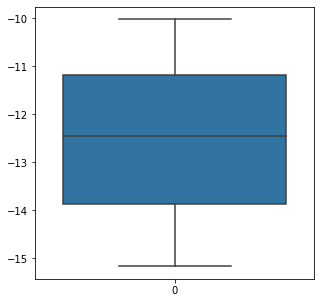

In [30]:
model = GradientBoostingRegressor(learning_rate=0.01, loss='absolute_error',
                          max_depth=8, min_samples_split=5, n_estimators=800)


cv_results = cross_val_score(model, Xt30, Y, cv=cv, n_jobs=-1, scoring='neg_mean_absolute_error')

f = plt.figure(figsize=(5,5))
sns.boxplot(data=cv_results)

print("%03s: %f (+/- %f)" % ("XGB", cv_results.mean(), cv_results.std()))

The results are far from good however it is a very difficult problem. Other thing to try for improving the results migh be trying apart from pca less features as given from the results in feature selection. We try for the 30 most important features however we do it now and not before the hyperparameter tuning due to high computational cost. 

In [48]:
imp.head(30).iloc[:,0].tolist()

['Dest_MDT',
 'Origin_MDT',
 'Dest_DCA',
 'Dest_RIC',
 'Origin_PHF',
 'Dest_PHF',
 'Origin_RIC',
 'Origin_BWI',
 'Dest_PHX',
 'Origin_SRQ',
 'Dest_SRQ',
 'Origin_DCA',
 'Origin_MDW',
 'Origin_ISP',
 'Dest_HPN',
 'Origin_BTV',
 'Dest_SAV',
 'Dest_SYR',
 'Origin_SAV',
 'Dest_PVD',
 'Origin_SYR',
 'Dest_CRW',
 'Origin_PHX',
 'Origin_STL',
 'Origin_HPN',
 'Origin_MEM',
 'Origin_MSP',
 'Origin_SDF',
 'Dest_BWI',
 'Dest_HOU']

In [49]:
new_index = ['ArrDelay','Dest_MDT',
 'Origin_MDT',
 'Dest_DCA',
 'Dest_RIC',
 'Origin_PHF',
 'Dest_PHF',
 'Origin_RIC',
 'Origin_BWI',
 'Dest_PHX',
 'Origin_SRQ',
 'Dest_SRQ',
 'Origin_DCA',
 'Origin_MDW',
 'Origin_ISP',
 'Dest_HPN',
 'Origin_BTV',
 'Dest_SAV',
 'Dest_SYR',
 'Origin_SAV',
 'Dest_PVD',
 'Origin_SYR',
 'Dest_CRW',
 'Origin_PHX',
 'Origin_STL',
 'Origin_HPN',
 'Origin_MEM',
 'Origin_MSP',
 'Origin_SDF',
 'Dest_BWI',
 'Dest_HOU']

dfn = df3.reindex(columns = new_index)



values = dfn.values

X = values[:,1:]
Y = values[:,0]

In [50]:
## GB final results 

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

GB =GradientBoostingRegressor(learning_rate=0.01, loss='absolute_error',
                          max_depth=8, min_samples_split=5, n_estimators=800)

GB.fit(X_train, y_train)

y_pred = GB.predict(X_test)

# Metrics 
r2 = r2_score(y_test,y_pred)
MAE = mean_absolute_error(y_test,y_pred)
MSE = mean_squared_error(y_test,y_pred)

print(f"r2 equals {r2} \n MAE equals {MAE} \n MSE equals {MSE}")

r2 equals -0.037836221177234286 
 MAE equals 12.995893520218406 
 MSE equals 559.3752867330687


So taking into account the results it is not a better solution to take the top features as extracted in feature selection stage.MAE is close to previous results. Lets try some more models 

In [51]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR # SVM
from sklearn.neural_network import MLPRegressor # ANN
from sklearn.linear_model import LarsCV 
from sklearn.metrics import mean_squared_error, r2_score # More than one metrics to check the robustness



# With all the data 

models = []
models.append(('LR',  LinearRegression()))
models.append(('Lasso', Lasso())) # Lasso incorporates L1 regularization 
models.append(('Ridge', Ridge())) # Ridge incorporates L2 regularization 
models.append(('ENet',  ElasticNet())) # L3 regularization 
models.append(('KNR',  KNeighborsRegressor()))
models.append(('DT', DecisionTreeRegressor()))

cv = KFold(n_splits=10)
scoring = "neg_mean_absolute_error"

results = []
names   = []
for i, model in models:
    cv_results = cross_val_score(model, X, Y, cv=cv, n_jobs=-1, scoring=scoring)
    results.append(cv_results)
    names.append(i)
    print("%03s: %f (+/- %f)" % (i, cv_results.mean(), cv_results.std()))


 LR: -5456596282.994261 (+/- 16369788808.689510)
Lasso: -13.667514 (+/- 1.340241)
Ridge: -13.659352 (+/- 1.344011)
ENet: -13.667514 (+/- 1.340241)
KNR: -13.998429 (+/- 2.007409)
 DT: -13.660046 (+/- 1.344700)


As expected nothing changes. Thus we keep the results of Gradient boosting after hypeparameter tuning as the best.

Since the best results from a regression is close to MAE 13, meaning that we can predict the delay with 13 minuites error, we could try to predict delays based on a classification approach.

In [11]:
# Create different classes based on time delays
df_mc = df3 

# Create 3 classes based on delays
df_mc['Class'] = df_mc.ArrDelay.map(lambda x: 0 if x<=0 else (1 if (x>0 and x<=10) else( 2 if (x>10 and x<=20) else 3)))

# drop Arrdelay because already included in Class 
df_mc.drop(columns='ArrDelay', inplace=True)

In [12]:
df_mc.Class.value_counts() # class distribution 

0    51474
1    25586
3    11989
2    11112
Name: Class, dtype: int64

Now we have a multiclass classification problem.

In [13]:
values = df_mc.values

X = values[:,:-1]
Y = values[:,-1]

In [16]:
from sklearn.tree import DecisionTreeClassifier # Decision Tree
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.naive_bayes import GaussianNB  # Naive Bayes
from sklearn.tree import DecisionTreeClassifier # Decision Tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb


cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

model = xgb.XGBClassifier(random_state=1,learning_rate=0.01)

cv_results = cross_val_score(model, X, Y, cv=cv, n_jobs=-1, scoring="accuracy")

print(cv_results.mean(), cv_results.std())


0.5204653868907416 0.0013541831837801635


For computational cost we will not try any other algorithm since xgb generally performs very well. (Random Forest, Decision tree and KNN also used without cv with worse results).

C:\Users\Tsaro\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:33:45] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


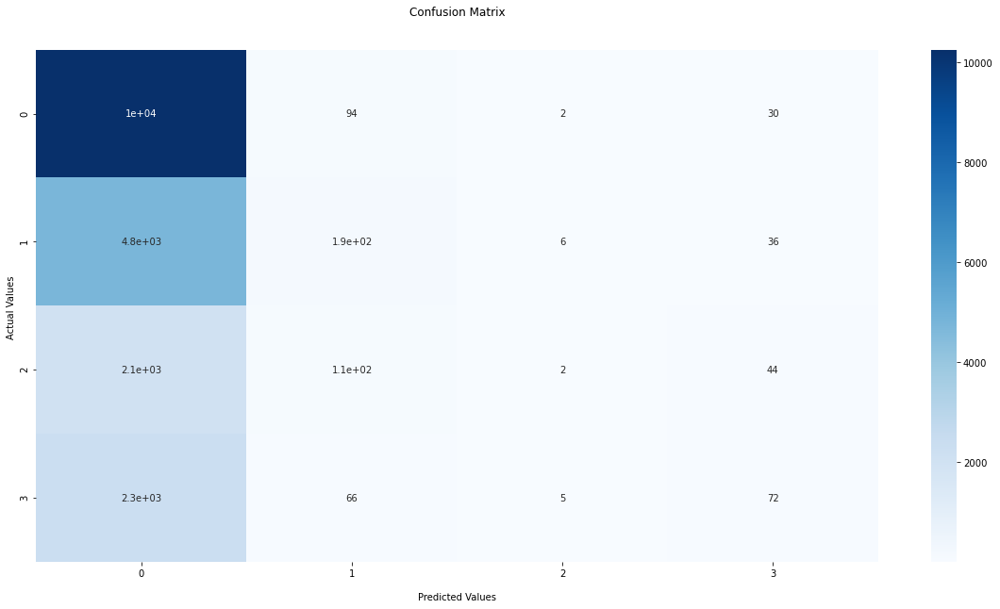

In [17]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns



X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

clf = xgb.XGBClassifier(random_state=1,learning_rate=0.01)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)


# Plot confusiom matrix
class_names = ["0", "1","2","3"]


#Generate the confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred)


plt.rcParams["figure.figsize"] = (20,10)
ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(["0", "1","2","3"])
ax.yaxis.set_ticklabels(["0", "1","2","3"])

## Display the visualization of the Confusion Matrix.
plt.show()

From the confusion matrix we can see that model fails to predict higher delays.

Trial with binary classification 

In [10]:
# to do so we have to label our data

# keep the dataset after the preprocessing steps before regression in previous step of the assignment 
df_class = df3 

# annotate the data as delays(class 1) if ArrDelay > 0 
df_class['Class'] = df_class.ArrDelay.map(lambda x: 1 if x>0 else 0)

# drop ArrDelay 
df_class.drop(columns='ArrDelay', inplace=True)

In [13]:
values = df_class.values

X = values[:,:-1]
Y = values[:,-1]

C:\Users\Tsaro\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:10:36] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


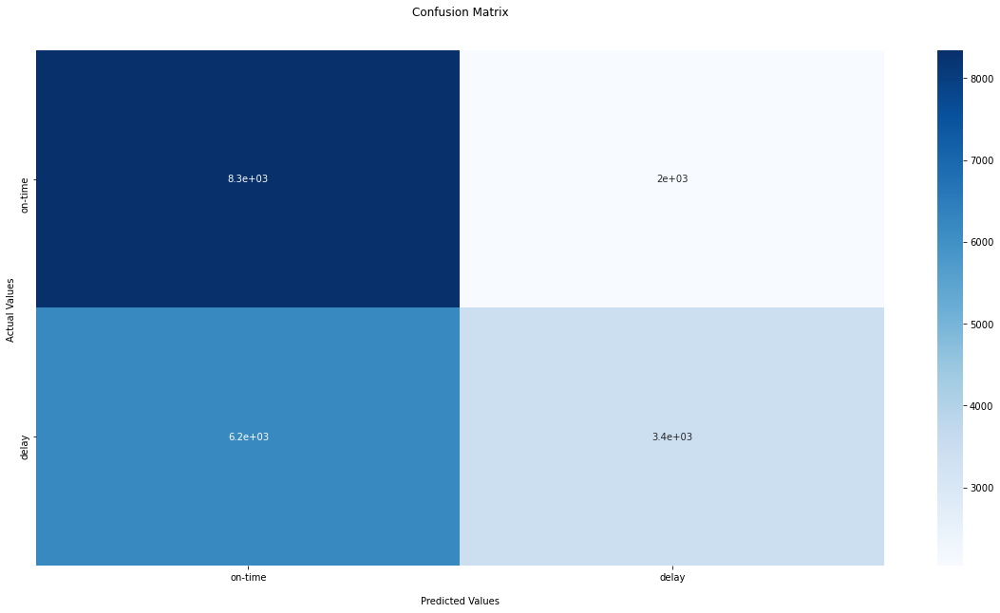

In [15]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns
import xgboost as xgb


X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

clf = xgb.XGBClassifier(random_state=1,learning_rate=0.01)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)


# Plot confusiom matrix
class_names = ["on-time","delay"]


#Generate the confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred)


plt.rcParams["figure.figsize"] = (20,10)
ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(["on-time","delay"])
ax.yaxis.set_ticklabels(["on-time","delay"])

## Display the visualization of the Confusion Matrix.
plt.show()

In [17]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score


# Metrics 
acc = accuracy_score(y_test, y_pred)

prec = precision_score(y_test, y_pred)

rec = recall_score(y_test, y_pred)

auc = roc_auc_score(y_test, y_pred)

f1 = f1_score(y_test, y_pred)


print(f'The accuracy score for XGB is {acc:.2f}')
print(f'The precession score for XGB is {prec:.2f}')
print(f'The recall score for XGB is {rec:.2f}')
print(f'The auc score for XGB is {auc:.2f}')
print(f'The f1 score for XGB is {f1:.2f}')

The accuracy score for XGB is 0.59
The precession score for XGB is 0.63
The recall score for XGB is 0.36
The auc score for XGB is 0.58
The f1 score for XGB is 0.46


From the results we can see that even in binary classifications the model fails to predict accurately the delay.

# Identify patterns/rules regarding delays and try to explain when delays should be expected, based on these patterns.

In [16]:
df_d['Origin_Dest'] = df_d.Origin + df_d.Dest

C:\Users\Tsaro\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [17]:
# Top combinations of origin and destination concerning the appearence of delays
df_d.Origin_Dest.value_counts().head(10)

ATLIAD    1607
ORDIAD    1527
DENIAD    1449
IADDEN    1427
IADORD    1317
IADATL    1300
BOSIAD    1230
IADPIT    1176
IADEWR    1173
IADBOS    1157
Name: Origin_Dest, dtype: int64

Thus, from the above we take the same insights as performed with the apriori algorithm that the combinations of origin - destination: 
* ALT - IAD , 
* ORD - IAD and 
* DEN - IAD 

is an association rule for delays. 

In [18]:
# Top origins concerning the appearence of delays
df_d.Origin.value_counts().head(10)

IAD    25327
ATL     1607
ORD     1527
DEN     1449
BOS     1230
LAX     1144
PIT     1068
LGA      959
BDL      876
DTW      861
Name: Origin, dtype: int64

In [19]:
# Top destinations concerning the appearence of delays
df_d.Dest.value_counts().head(10)

IAD    23360
DEN     1427
ORD     1317
ATL     1300
PIT     1176
EWR     1173
BOS     1157
LGA     1150
LAX     1072
BDL     1071
Name: Dest, dtype: int64

Another pattern, aligned with apriori results is that when IAD is either in Origin or Destination it is possible to have delay.

In [56]:
# percentage of delay flights per Origin 

z = pd.DataFrame(df.Origin.value_counts())


z['delay_flights'] = df_d.Origin.value_counts()


z['%_delay'] = z.delay_flights / z.Origin * 100

z = z.sort_values(by='%_delay', ascending=False)


z.to_excel('output1.xlsx')

z

,Origin,delay_flights,%_delay
MDT,1,1,100.000000
RIC,4,4,100.000000
PVD,296,246,83.108108
SRQ,85,64,75.294118
MHT,447,330,73.825503
PWM,303,202,66.666667
PIT,1701,1068,62.786596
SJU,277,170,61.371841
STL,902,549,60.864745
SFO,1397,813,58.196135


In [57]:
# percentage of delay flights per Destination 

z = pd.DataFrame(df.Dest.value_counts())


z['delay_flights'] = df_d.Dest.value_counts()


z['%_delay'] = z.delay_flights / z.Dest * 100

z = z.sort_values(by='%_delay', ascending=False)

z.to_excel('output1.xlsx')

z

,Dest,delay_flights,%_delay
MDT,1,1,100.000000
RIC,5,4,80.000000
FLL,747,570,76.305221
MDW,63,48,76.190476
CHS,524,392,74.809160
PIT,1727,1176,68.094962
HOU,198,134,67.676768
MSP,666,440,66.066066
PHL,784,514,65.561224
MCO,1676,1043,62.231504


In [22]:
# Count of delays per airline 
df_d.UniqueCarrier.value_counts()

UA        30480
CO         4260
AA         3731
NW         2889
DL         2619
US         2202
TW         1540
EA          736
PA (1)      230
Name: UniqueCarrier, dtype: int64

In [23]:
# Total number of flights 
df.UniqueCarrier.value_counts()

UA        63706
CO         9219
AA         8620
NW         5521
DL         4793
US         3513
TW         3056
EA         1420
PA (1)      313
Name: UniqueCarrier, dtype: int64

In [58]:
# percentage of delay flights per airline 

z = pd.DataFrame(df.UniqueCarrier.value_counts())


z['delay_flights'] = df_d.UniqueCarrier.value_counts()


z['%_delay'] = z.delay_flights / z.UniqueCarrier * 100

z = z.sort_values(by='%_delay', ascending=False)

z.to_excel('output1.xlsx')

z

,UniqueCarrier,delay_flights,%_delay
PA (1),313,230,73.482428
US,3513,2202,62.681469
DL,4793,2619,54.642187
NW,5521,2889,52.327477
EA,1420,736,51.830986
TW,3056,1540,50.392670
UA,63706,30480,47.844787
CO,9219,4260,46.208916
AA,8620,3731,43.283063


In [36]:
# delay compared to day of week 
print(df_d.groupby(['DayofWeek'])['ArrDelay'].count())

print(df_d.groupby(['DayofWeek'])['ArrDelay'].mean())


DayofWeek
1    6877
2    7190
3    7514
4    7554
5    7712
6    5680
7    6160
Name: ArrDelay, dtype: int64
DayofWeek
1    19.342010
2    18.428790
3    18.885946
4    17.839423
5    18.394061
6    16.198592
7    17.264773
Name: ArrDelay, dtype: float64


It seems that the day of the week by itself does not indicate a kind of strong pattern for delays, apart from that on mondays the delays have higher mean delay.

In [39]:
# delay compared to departure time 
dfd = df2[df2.ArrDelay>0]


print(dfd.groupby(['CRSDepTime'])['ArrDelay'].count())

print(dfd.groupby(['CRSDepTime'])['ArrDelay'].mean())

CRSDepTime
0        1
1     2090
2     2765
3     7664
4     3678
5     7142
6     5318
7     8070
8     3183
9     6000
10    2585
11     191
Name: ArrDelay, dtype: int64
CRSDepTime
0      6.000000
1     15.589952
2     11.980470
3     15.998043
4     13.352094
5     15.176561
6     17.770590
7     20.998141
8     23.331762
9     23.623167
10    20.967892
11    12.623037
Name: ArrDelay, dtype: float64


Based on the above results we can infer that when the departure time falls in bin 7 there is higher probability of delay and thus the delay is dependent on departure time.

#### We shall try rule extraction regarding delays via a Decision tree classifier 

In [42]:
# to do so we have to label our data

# keep the dataset after the preprocessing steps before regression in previous step of the assignment 
df_class = df3 

# annotate the data as delays(class 1) if ArrDelay > 0 
df_class['Class'] = df_class.ArrDelay.map(lambda x: 1 if x>0 else 0)

# drop ArrDelay 
df_class.drop(columns='ArrDelay', inplace=True)


In [43]:
values = df_class.values

X = values[:,:-1]
Y = values[:,-1]

In [44]:
# Class allocation 

df_class.Class.value_counts() #slightly imbalanced 

0    51474
1    48687
Name: Class, dtype: int64

In [46]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold


model = DecisionTreeClassifier(criterion='entropy', max_depth=None, random_state=0)


cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scoring = "accuracy" # for binary targets and due to slight imbalanced dataset 
 
cv_results = cross_val_score(model, X, Y, cv=cv, n_jobs=-1, scoring=scoring)

print(" %f (+/- %f)" % (cv_results.mean(), cv_results.std()))


 0.617692 (+/- 0.004335)


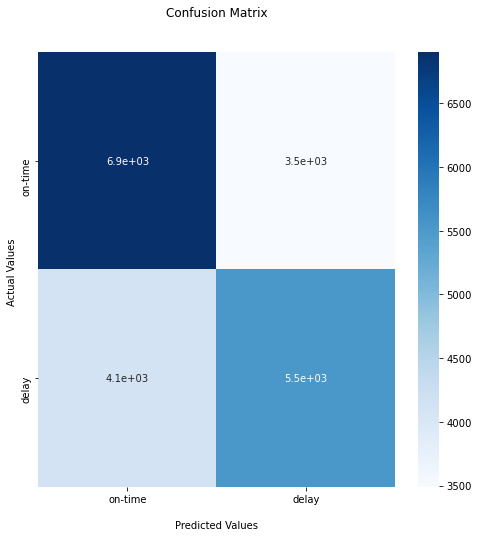

In [51]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns


X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

clf = DecisionTreeClassifier(criterion='entropy', max_depth=None, random_state=0)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)


# Plot confusiom matrix
class_names = ["on-time","delay"]


#Generate the confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred)


plt.rcParams["figure.figsize"] = (8,8)
ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Confusion Matrix\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(["on-time","delay"])
ax.yaxis.set_ticklabels(["on-time","delay"])

## Display the visualization of the Confusion Matrix.
plt.show()

In [47]:
from sklearn.model_selection import train_test_split

# Split the data to training and test sets

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)


# Fit decision tree. the max_depth was set to 4 in order to extract interpretable rule
tree = DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=0)
tree.fit(X_train, y_train)


DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=0)

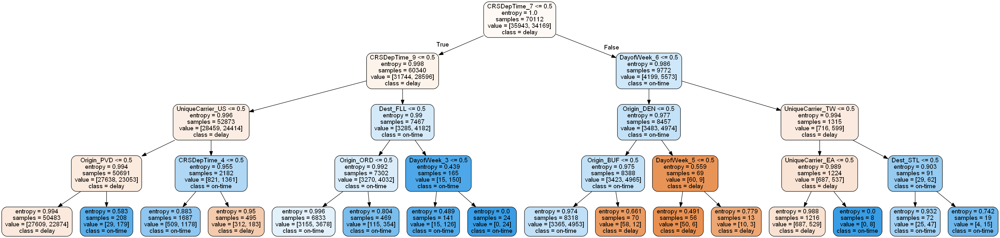

In [48]:
from six import StringIO 
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus


# Visualize the tree. 

dot_data = StringIO()

export_graphviz(tree, 
                out_file='tree.dot', 
                feature_names=df_class.columns.to_list()[:-1])

dot_data = export_graphviz(
    tree, 
    out_file=None,
    feature_names=df_class.columns.to_list()[:-1],  
    class_names=['delay', 'on-time'],  
    filled=True,
    rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [49]:
# Rule extraction 

from sklearn.tree import export_text

tree_rules = export_text(tree, feature_names=df_class.columns.to_list()[:-1])
print(tree_rules)

|--- CRSDepTime_7 <= 0.50
|   |--- CRSDepTime_9 <= 0.50
|   |   |--- UniqueCarrier_US <= 0.50
|   |   |   |--- Origin_PVD <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- Origin_PVD >  0.50
|   |   |   |   |--- class: 1
|   |   |--- UniqueCarrier_US >  0.50
|   |   |   |--- CRSDepTime_4 <= 0.50
|   |   |   |   |--- class: 1
|   |   |   |--- CRSDepTime_4 >  0.50
|   |   |   |   |--- class: 0
|   |--- CRSDepTime_9 >  0.50
|   |   |--- Dest_FLL <= 0.50
|   |   |   |--- Origin_ORD <= 0.50
|   |   |   |   |--- class: 1
|   |   |   |--- Origin_ORD >  0.50
|   |   |   |   |--- class: 1
|   |   |--- Dest_FLL >  0.50
|   |   |   |--- DayofWeek_3 <= 0.50
|   |   |   |   |--- class: 1
|   |   |   |--- DayofWeek_3 >  0.50
|   |   |   |   |--- class: 1
|--- CRSDepTime_7 >  0.50
|   |--- DayofWeek_6 <= 0.50
|   |   |--- Origin_DEN <= 0.50
|   |   |   |--- Origin_BUF <= 0.50
|   |   |   |   |--- class: 1
|   |   |   |--- Origin_BUF >  0.50
|   |   |   |   |--- class: 0
|   |   |--- Origin_DEN >